In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [13]:
traffic_df = pd.read_csv("Metro_Interstate_Traffic_Volume.csv")

In [14]:
X = traffic_df['snow_1h'] 
Y = traffic_df['traffic_volume'] 

## Create A, the augmented data array
A_X = X.to_numpy().reshape(len(X),1)
ones = np.ones([len(X),1], dtype = int)

A1 = np.append(ones, A_X, 1)

## Solve for w, the weight vector

w1 = np.linalg.lstsq(A1,Y, rcond=None)[0]
y_pred1 = np.matmul(A1, w1)

print("Model 1:")
print("(traffic volume) = %f  + %f * (snow in mm)" % (w1[0],w1[1]))

Model 1:
(traffic volume) = 3259.778678  + 178.415965 * (snow in mm)


In [15]:
## Create A, the augmented data array

A_X1 = X.to_numpy().reshape(len(X),1)
ones = np.ones([len(X),1], dtype= int)
squares = np.square(A_X1)

A2 = np.append(ones, A_X1,1)
A2 = np.append(A2, squares, 1)

## Solve for w2, the weight vector
w2 = np.linalg.lstsq(A2,Y, rcond=None)[0]
y_pred2 = np.matmul(A2, w2)

print("Model M2:")
print("(traffic Volume) = %f  + %f * (snow in mm) + %f * (snow in mm)^2" % (w2[0],w2[1],w2[2]))

Model M2:
(traffic Volume) = 3260.014285  + -4218.569786 * (snow in mm) + 11118.234059 * (snow in mm)^2


In [16]:
## Create a smooth set of X values for plotting the model
lineinput = np.linspace(0,0.6,100)
## Send the X values for plotting through the linear model
ones = np.ones(len(lineinput))
squares = np.square(lineinput)

A3 = np.vstack([ones, lineinput]).T
A4 = np.vstack([ones,lineinput,squares]).T

yplot1 = np.matmul(A3, w1)
yplot2 = np.matmul(A4, w2)

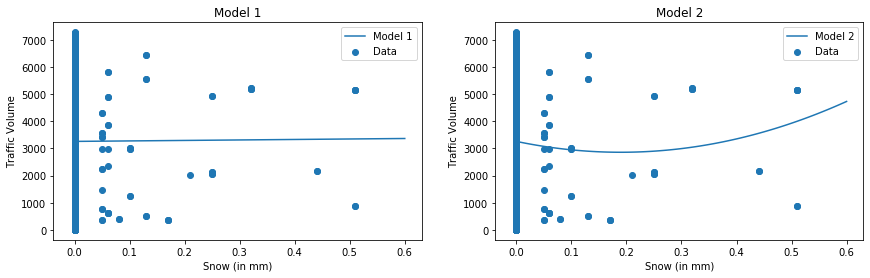

In [17]:
fig, axs = plt.subplots(1, 2)
plt.subplots_adjust(left=None, bottom=None, right=2, top=None, wspace=None, hspace=None)

plt.subplot(1,2,1)
plt.scatter(X, Y, label = "Data")
plt.plot(lineinput, yplot1, label = "Model 1")
plt.ylabel('Traffic Volume')
plt.xlabel('Snow (in mm)') 
plt.title('Model 1')
plt.legend()

plt.subplot(1,2,2)
plt.scatter(X, Y, label = "Data")
plt.plot(lineinput, yplot2, label = "Model 2")
plt.ylabel('Traffic Volume')
plt.xlabel('Snow (in mm)')
plt.title('Model 2')
plt.legend()
plt.show()

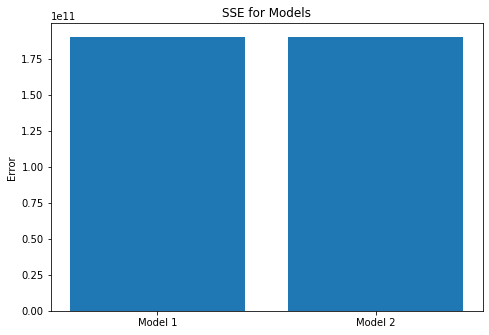

model1_SSE: 190286799091.2039 model2_SSE: 190279296872.6484


In [18]:
model1_SSE = sum((y_pred1 - Y)**2)
model2_SSE = sum((y_pred2 - Y)**2)

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
x = ['Model 1', 'Model 2']
y = [model1_SSE, model2_SSE]
ax.bar(x,y)
plt.ylabel('Error')
plt.title('SSE for Models')
plt.show()
print('model1_SSE:', model1_SSE, 'model2_SSE:', model2_SSE)